<h4>| Base contendo todas as questões</h4>

In [1]:
import numpy as np
import pandas as pd
import plotly.express as px
import plotly.graph_objects as go
from diskcache import Cache
from appdirs import user_cache_dir
from pycaret.clustering import *
from sklearn.decomposition import PCA
from sklearn.metrics import pairwise_distances_argmin_min

cache = Cache(user_cache_dir("cache"))
GENERATED_DATASET_PATH = cache.get("GENERATED_DATASET_PATH")

df = pd.read_csv(f'{GENERATED_DATASET_PATH}/df.csv')
df_aux = df.copy()
df_aux.drop(columns=['curso'], inplace=True)

In [2]:
# https://colab.research.google.com/github/pycaret/pycaret/blob/master/tutorials/Tutorial%20-%20Clustering.ipynb#scrollTo=8e1442ef
s = setup(df_aux, low_variance_threshold=0.05, session_id=42)

,Description,Value
0,Session id,42
1,Original data shape,"(611, 210)"
2,Transformed data shape,"(611, 120)"
3,Numeric features,210
4,Preprocess,True
5,Imputation type,simple
6,Numeric imputation,mean
7,Categorical imputation,mode
8,Low variance threshold,0.050000
9,CPU Jobs,-1


In [40]:
s.models()

,Name,Reference
ID,,
kmeans,K-Means Clustering,sklearn.cluster._kmeans.KMeans
ap,Affinity Propagation,sklearn.cluster._affinity_propagation.Affinity...
meanshift,Mean Shift Clustering,sklearn.cluster._mean_shift.MeanShift
sc,Spectral Clustering,sklearn.cluster._spectral.SpectralClustering
hclust,Agglomerative Clustering,sklearn.cluster._agglomerative.AgglomerativeCl...
dbscan,Density-Based Spatial Clustering,sklearn.cluster._dbscan.DBSCAN
optics,OPTICS Clustering,sklearn.cluster._optics.OPTICS
birch,Birch Clustering,sklearn.cluster._birch.Birch


#### 📊 Aplicando os algoritmos de clustering

##### 💻️ K-Means Clustering

In [3]:
kmeans_model = create_model("kmeans", num_clusters=7)

In [4]:
evaluate_model(kmeans_model)

interactive(children=(ToggleButtons(description='Plot Type:', icons=('',), options=(('Pipeline Plot', 'pipelin…

In [5]:
assign_model_kmeans = assign_model(kmeans_model)
assign_model_kmeans

,serie,tipo_residente_externo,tipo_residente_interno,tipo_residente_semi_residente,atv_cultural_apresentacoes musicais,atv_cultural_artesanato,atv_cultural_crio historia e enigmas,atv_cultural_danca,atv_cultural_edicoes de video...,atv_cultural_esporte,...,transporte_nenhuma opcao,projetos_a_participar_adicionar sessões de RPG.,projetos_a_participar_aula de volei para todos,projetos_a_participar_nenhuma opcao,projetos_a_participar_oficina de teclado,projetos_a_participar_oficina de violao,projetos_a_participar_radio do campus,projetos_a_participar_recuperacao e ocupacao do antigo cine januaria,projetos_a_participar_time de e-sports do campus e torneios intercampis.,Cluster
0,1,0,1,0,0,0,0,1,0,0,...,0,0,0,0,0,0,0,1,0,Cluster 5
1,1,0,1,0,0,0,0,0,0,0,...,1,0,0,0,0,1,0,0,0,Cluster 5
2,1,1,0,0,0,1,0,1,0,0,...,0,0,0,0,0,0,0,1,0,Cluster 1
3,1,1,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,1,0,Cluster 1
4,1,1,0,0,0,0,0,0,0,0,...,0,0,0,0,0,1,0,0,0,Cluster 6
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
606,3,1,0,0,0,0,0,1,0,0,...,0,0,0,0,0,0,0,1,0,Cluster 2
607,3,1,0,0,0,0,0,0,0,0,...,0,0,0,1,0,0,0,0,0,Cluster 3
608,3,1,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,1,0,Cluster 2
609,3,1,0,0,0,0,0,0,0,0,...,0,0,0,0,0,1,0,0,0,Cluster 6


In [44]:
# Atribuindo rótulos
clustered_df = assign_model(kmeans_model)

# Obtendo features do PyCaret
X = get_config('X_transformed').values

# Calculando distância de cada ponto ao seu centroide
closest, distances = pairwise_distances_argmin_min(X, kmeans_model.cluster_centers_)

# Adicionando ao dataframe
clustered_df['distance_to_centroid'] = distances

# PCA nos dados
pca = PCA(n_components=2)
components = pca.fit_transform(X)

# PCA nos centroides (mesmo PCA)
centroids_2d = pca.transform(kmeans_model.cluster_centers_)

# Adiciona ao dataframe
clustered_df['feature1'] = components[:, 0]
clustered_df['feature2'] = components[:, 1]

# Outliers com distância acima de 95% dos dados
limit = clustered_df['distance_to_centroid'].quantile(0.95)
clustered_df['is_outlier'] = (clustered_df['distance_to_centroid'] > limit).astype(int)

# Subconjunto para plotar os outliers
outliers = clustered_df[clustered_df['is_outlier'] == 1]

# Plot dos dados
fig = px.scatter(
    clustered_df, 
    x='feature1',
    y='feature2',
    color='Cluster',
    size='distance_to_centroid',
    hover_data=['distance_to_centroid'],
    title='Identificação de Outliers com relação à distância dos Centroides',
    height=800,
    color_discrete_sequence=px.colors.qualitative.Set3,
    render_mode='linear'
)

# Centroides
fig.add_scatter(
    x=centroids_2d[:, 0],
    y=centroids_2d[:, 1],
    mode='markers',
    marker=dict(size=20, color='blue'),
    name='Centroides'
)

# Outliers
fig.add_scatter(
    name='Outliers',
    x=outliers['feature1'],
    y=outliers['feature2'],
    mode='markers',
    marker=dict(symbol='x', color='red', size=10),
)

fig.show()

In [45]:
# Tabela com a relação dos valores considerados como outliers
clustered_df.loc[clustered_df['is_outlier'] == 1]

,serie,tipo_residente,atv_cultural_apresentacoes musicais,atv_cultural_artesanato,atv_cultural_crio historia e enigmas,atv_cultural_danca,atv_cultural_edicoes de video...,atv_cultural_esporte,atv_cultural_fotografia,atv_cultural_futsal,...,projetos_a_participar_oficina de teclado,projetos_a_participar_oficina de violao,projetos_a_participar_radio do campus,projetos_a_participar_recuperacao e ocupacao do antigo cine januaria,projetos_a_participar_time de e-sports do campus e torneios intercampis.,Cluster,distance_to_centroid,feature1,feature2,is_outlier
4,0,0,0,0,0,0,0,0,0,0,...,0,1,0,0,0,Cluster 2,5.001350,1.532349,2.339079,1
75,0,2,0,0,0,0,0,0,0,0,...,0,1,0,1,0,Cluster 1,4.975785,0.772245,1.120752,1
92,0,0,0,0,0,0,0,0,0,0,...,0,1,0,0,0,Cluster 5,4.901374,-0.768441,1.427919,1
105,0,1,0,0,0,0,0,0,0,0,...,0,1,1,0,0,Cluster 6,4.916493,1.227170,1.819513,1
130,1,0,0,0,0,1,0,0,0,0,...,0,1,1,1,0,Cluster 0,4.886139,2.168866,-0.468263,1
132,1,2,0,1,0,1,0,0,0,0,...,0,1,0,0,0,Cluster 6,5.068890,1.574197,1.274660,1
134,1,2,0,0,0,0,0,0,0,0,...,0,1,0,0,0,Cluster 2,4.974165,1.528815,3.044698,1
216,1,1,0,0,0,0,0,0,0,0,...,0,1,1,0,0,Cluster 2,5.262268,1.099715,2.191474,1
225,2,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,Cluster 6,5.330200,0.594502,1.754065,1
241,2,0,0,1,0,1,0,0,0,0,...,0,0,0,0,0,Cluster 6,5.307721,1.930238,0.525886,1


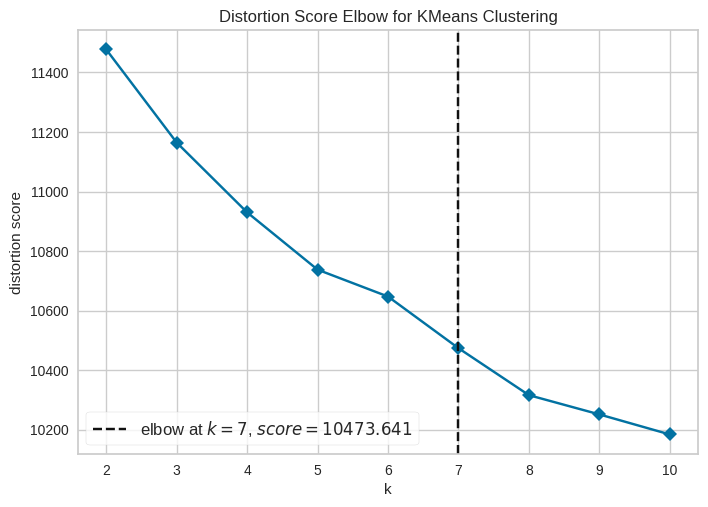

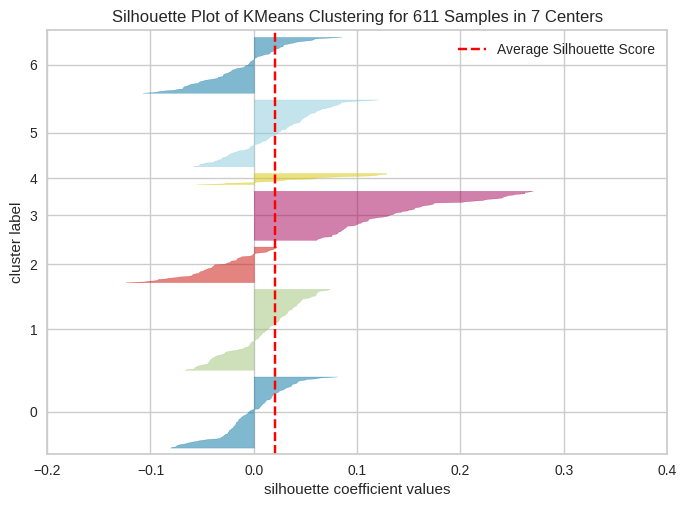

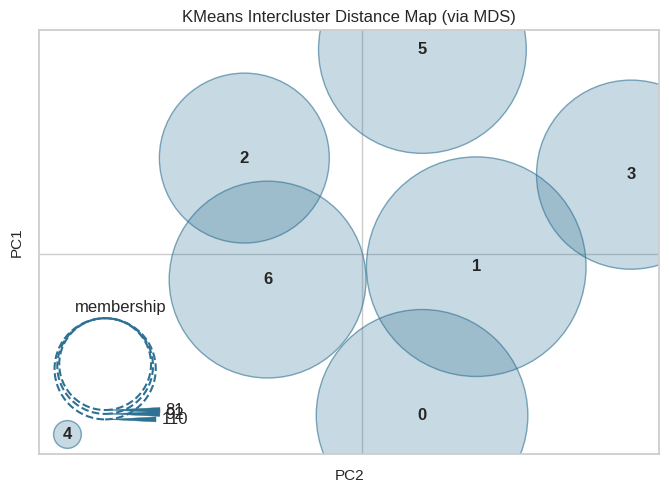

In [46]:
# **List of available plots (ID - Name):**

# 1. 'cluster' - Cluster PCA Plot (2d)  
# 2. 'tsne' - Cluster t-SNE (3d)  
# 3. 'elbow' - Elbow Plot  
# 4. 'silhouette' - Silhouette Plot  
# 5. 'distance' - Distance Plot  
# 6. 'distribution' - Distribution Plot  

plot_model(kmeans_model, plot="cluster")
plot_model(kmeans_model, plot="tsne")
plot_model(kmeans_model, plot="elbow")
plot_model(kmeans_model, plot="silhouette")
plot_model(kmeans_model, plot="distance")
plot_model(kmeans_model, plot="distribution")

##### 💻️ Affinity Propagation

In [47]:
ap = create_model("ap", num_clusters=3)

,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.0060,4.5538,3.0782,0,0,0


In [48]:
evaluate_model(ap)

interactive(children=(ToggleButtons(description='Plot Type:', icons=('',), options=(('Pipeline Plot', 'pipelin…

In [49]:
assign_model_ap = assign_model(ap)
assign_model_ap

,serie,tipo_residente,atv_cultural_apresentacoes musicais,atv_cultural_artesanato,atv_cultural_crio historia e enigmas,atv_cultural_danca,atv_cultural_edicoes de video...,atv_cultural_esporte,atv_cultural_fotografia,atv_cultural_futsal,...,transporte_nenhuma opcao,projetos_a_participar_adicionar sessões de RPG.,projetos_a_participar_aula de volei para todos,projetos_a_participar_nenhuma opcao,projetos_a_participar_oficina de teclado,projetos_a_participar_oficina de violao,projetos_a_participar_radio do campus,projetos_a_participar_recuperacao e ocupacao do antigo cine januaria,projetos_a_participar_time de e-sports do campus e torneios intercampis.,Cluster
0,0,1,0,0,0,1,0,0,0,0,...,0,0,0,0,0,0,0,1,0,Cluster 33
1,0,1,0,0,0,0,0,0,0,0,...,1,0,0,0,0,1,0,0,0,Cluster 24
2,0,0,0,1,0,1,0,0,0,0,...,0,0,0,0,0,0,0,1,0,Cluster 27
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,1,0,Cluster 40
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,1,0,0,0,Cluster 10
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
606,2,0,0,0,0,1,0,0,0,0,...,0,0,0,0,0,0,0,1,0,Cluster 48
607,2,0,0,0,0,0,0,0,0,0,...,0,0,0,1,0,0,0,0,0,Cluster 43
608,2,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,1,0,Cluster 42
609,2,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,1,0,0,0,Cluster 15


In [50]:
# plot_model(ap, plot="cluster")
# plot_model(ap, plot="tsne")
# plot_model(ap, plot="elbow")
# plot_model(ap, plot="silhouette")
# plot_model(ap, plot="distance")
# plot_model(ap, plot="distribution")

##### 💻️ Mean Shift Clustering

In [51]:
meanshift = create_model("meanshift", num_clusters=3)

,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0,0,0,0,0,0


In [52]:
evaluate_model(meanshift)

interactive(children=(ToggleButtons(description='Plot Type:', icons=('',), options=(('Pipeline Plot', 'pipelin…

In [53]:
assign_model_meanshift = assign_model(meanshift)
assign_model_meanshift

,serie,tipo_residente,atv_cultural_apresentacoes musicais,atv_cultural_artesanato,atv_cultural_crio historia e enigmas,atv_cultural_danca,atv_cultural_edicoes de video...,atv_cultural_esporte,atv_cultural_fotografia,atv_cultural_futsal,...,transporte_nenhuma opcao,projetos_a_participar_adicionar sessões de RPG.,projetos_a_participar_aula de volei para todos,projetos_a_participar_nenhuma opcao,projetos_a_participar_oficina de teclado,projetos_a_participar_oficina de violao,projetos_a_participar_radio do campus,projetos_a_participar_recuperacao e ocupacao do antigo cine januaria,projetos_a_participar_time de e-sports do campus e torneios intercampis.,Cluster
0,0,1,0,0,0,1,0,0,0,0,...,0,0,0,0,0,0,0,1,0,Cluster 0
1,0,1,0,0,0,0,0,0,0,0,...,1,0,0,0,0,1,0,0,0,Cluster 0
2,0,0,0,1,0,1,0,0,0,0,...,0,0,0,0,0,0,0,1,0,Cluster 0
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,1,0,Cluster 0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,1,0,0,0,Cluster 0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
606,2,0,0,0,0,1,0,0,0,0,...,0,0,0,0,0,0,0,1,0,Cluster 0
607,2,0,0,0,0,0,0,0,0,0,...,0,0,0,1,0,0,0,0,0,Cluster 0
608,2,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,1,0,Cluster 0
609,2,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,1,0,0,0,Cluster 0


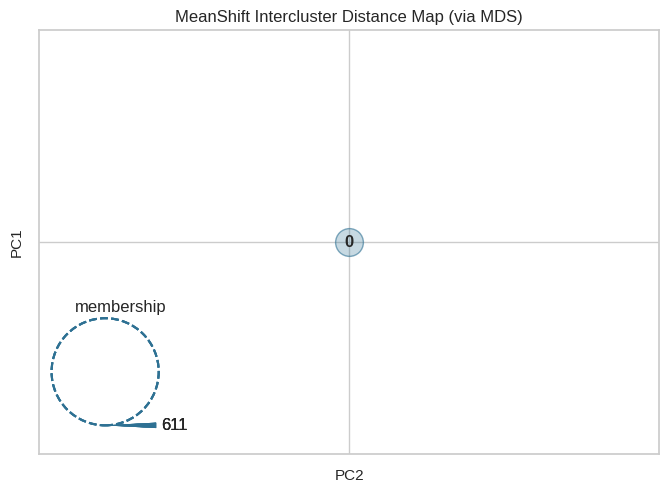

In [54]:
plot_model(meanshift, plot="cluster")
plot_model(meanshift, plot="tsne")
# plot_model(meanshift, plot="elbow")
# plot_model(meanshift, plot="silhouette")
plot_model(meanshift, plot="distance")
plot_model(meanshift, plot="distribution")

##### 💻️ Spectral Clustering

In [55]:
sc = create_model("sc", num_clusters=3)

,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.0463,2.0554,1.5483,0,0,0


In [56]:
evaluate_model(sc)

interactive(children=(ToggleButtons(description='Plot Type:', icons=('',), options=(('Pipeline Plot', 'pipelin…

In [57]:
assign_model_sc = assign_model(sc)
assign_model_sc

,serie,tipo_residente,atv_cultural_apresentacoes musicais,atv_cultural_artesanato,atv_cultural_crio historia e enigmas,atv_cultural_danca,atv_cultural_edicoes de video...,atv_cultural_esporte,atv_cultural_fotografia,atv_cultural_futsal,...,transporte_nenhuma opcao,projetos_a_participar_adicionar sessões de RPG.,projetos_a_participar_aula de volei para todos,projetos_a_participar_nenhuma opcao,projetos_a_participar_oficina de teclado,projetos_a_participar_oficina de violao,projetos_a_participar_radio do campus,projetos_a_participar_recuperacao e ocupacao do antigo cine januaria,projetos_a_participar_time de e-sports do campus e torneios intercampis.,Cluster
0,0,1,0,0,0,1,0,0,0,0,...,0,0,0,0,0,0,0,1,0,Cluster 0
1,0,1,0,0,0,0,0,0,0,0,...,1,0,0,0,0,1,0,0,0,Cluster 0
2,0,0,0,1,0,1,0,0,0,0,...,0,0,0,0,0,0,0,1,0,Cluster 0
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,1,0,Cluster 0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,1,0,0,0,Cluster 0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
606,2,0,0,0,0,1,0,0,0,0,...,0,0,0,0,0,0,0,1,0,Cluster 0
607,2,0,0,0,0,0,0,0,0,0,...,0,0,0,1,0,0,0,0,0,Cluster 0
608,2,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,1,0,Cluster 0
609,2,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,1,0,0,0,Cluster 0


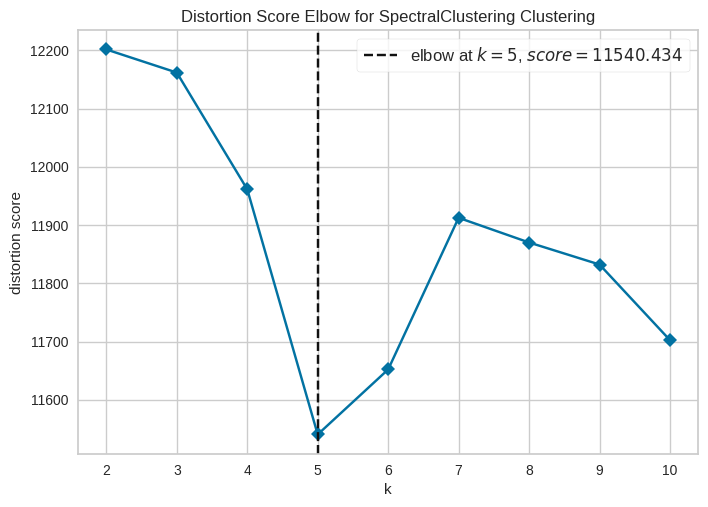

In [58]:
plot_model(sc, plot="cluster")
plot_model(sc, plot="tsne")
plot_model(sc, plot="elbow")
# plot_model(sc, plot="silhouette")
# plot_model(sc, plot="distance")
plot_model(sc, plot="distribution")

##### 💻️ Agglomerative Clustering

In [59]:
hclust_model = create_model("hclust", num_clusters=5)

,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,-0.0027,17.4478,4.4054,0,0,0


In [60]:
evaluate_model(hclust_model)

interactive(children=(ToggleButtons(description='Plot Type:', icons=('',), options=(('Pipeline Plot', 'pipelin…

In [61]:
assign_model_hclust = assign_model(hclust_model)
assign_model_hclust

,serie,tipo_residente,atv_cultural_apresentacoes musicais,atv_cultural_artesanato,atv_cultural_crio historia e enigmas,atv_cultural_danca,atv_cultural_edicoes de video...,atv_cultural_esporte,atv_cultural_fotografia,atv_cultural_futsal,...,transporte_nenhuma opcao,projetos_a_participar_adicionar sessões de RPG.,projetos_a_participar_aula de volei para todos,projetos_a_participar_nenhuma opcao,projetos_a_participar_oficina de teclado,projetos_a_participar_oficina de violao,projetos_a_participar_radio do campus,projetos_a_participar_recuperacao e ocupacao do antigo cine januaria,projetos_a_participar_time de e-sports do campus e torneios intercampis.,Cluster
0,0,1,0,0,0,1,0,0,0,0,...,0,0,0,0,0,0,0,1,0,Cluster 0
1,0,1,0,0,0,0,0,0,0,0,...,1,0,0,0,0,1,0,0,0,Cluster 0
2,0,0,0,1,0,1,0,0,0,0,...,0,0,0,0,0,0,0,1,0,Cluster 3
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,1,0,Cluster 3
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,1,0,0,0,Cluster 0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
606,2,0,0,0,0,1,0,0,0,0,...,0,0,0,0,0,0,0,1,0,Cluster 1
607,2,0,0,0,0,0,0,0,0,0,...,0,0,0,1,0,0,0,0,0,Cluster 4
608,2,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,1,0,Cluster 1
609,2,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,1,0,0,0,Cluster 0


In [62]:
import pycaret.anomaly as anomaly

sa = anomaly.setup(assign_model_hclust, low_variance_threshold=0.05, session_id=42)
model = anomaly.create_model('iforest')

,Description,Value
0,Session id,42
1,Original data shape,"(611, 209)"
2,Transformed data shape,"(611, 123)"
3,Numeric features,208
4,Categorical features,1
5,Preprocess,True
6,Imputation type,simple
7,Numeric imputation,mean
8,Categorical imputation,mode
9,Maximum one-hot encoding,-1


In [73]:
anomaly.models()

,Name,Reference
ID,,
abod,Angle-base Outlier Detection,pyod.models.abod.ABOD
cluster,Clustering-Based Local Outlier,pycaret.internal.patches.pyod.CBLOFForceToDouble
cof,Connectivity-Based Local Outlier,pyod.models.cof.COF
iforest,Isolation Forest,pyod.models.iforest.IForest
histogram,Histogram-based Outlier Detection,pyod.models.hbos.HBOS
knn,K-Nearest Neighbors Detector,pyod.models.knn.KNN
lof,Local Outlier Factor,pyod.models.lof.LOF
svm,One-class SVM detector,pyod.models.ocsvm.OCSVM
pca,Principal Component Analysis,pyod.models.pca.PCA


In [63]:
outliers = anomaly.assign_model(model)

# Obtendo features do PyCaret
X = anomaly.get_config('X_transformed').values

# PCA nos dados
pca = PCA(n_components=2)
components = pca.fit_transform(X)

# Adiciona ao dataframe
outliers['feature1'] = components[:, 0]
outliers['feature2'] = components[:, 1]

# Subconjunto para plotar os outliers
outliers = outliers[outliers['Anomaly'] == 1]

# Plot dos dados
fig = px.scatter(
    outliers, 
    x='feature1',
    y='feature2',
    color='Cluster',
    size='Anomaly_Score',
    hover_data=['Anomaly_Score'],
    title='Identificação de Outliers',
    height=800,
    color_discrete_sequence=px.colors.qualitative.Set3,
)

# # Centroides
# fig.add_scatter(
#     x=centroids_2d[:, 0],
#     y=centroids_2d[:, 1],
#     mode='markers',
#     marker=dict(size=20, color='blue'),
#     name='Centroides'
# )

# Outliers
fig.add_scatter(
    name='Outliers',
    x=outliers['feature1'],
    y=outliers['feature2'],
    mode='markers',
    marker=dict(symbol='x', color='red', size=10),
)

fig.show()

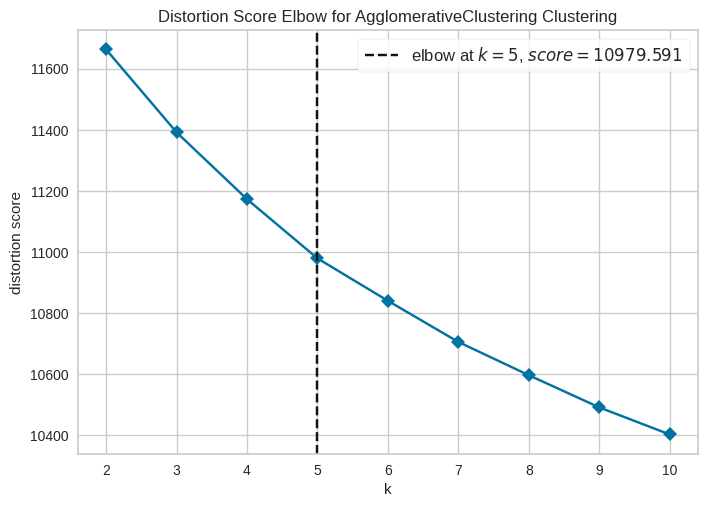

In [64]:
plot_model(hclust_model, plot="cluster")
plot_model(hclust_model, plot="tsne")
plot_model(hclust_model, plot="elbow")
# plot_model(hclust, plot="silhouette")
# plot_model(hclust, plot="distance")
plot_model(hclust_model, plot="distribution")

##### 💻️ Density-Based Spatial Clustering

In [6]:
dbscan = create_model("dbscan", eps=1.0, min_samples=2)

,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,-0.0689,2.2216,1.3231,0,0,0


In [ ]:
evaluate_model(dbscan)

interactive(children=(ToggleButtons(description='Plot Type:', icons=('',), options=(('Pipeline Plot', 'pipelin…

In [67]:
assign_model_dbscan = assign_model(dbscan)
assign_model_dbscan

,serie,tipo_residente,atv_cultural_apresentacoes musicais,atv_cultural_artesanato,atv_cultural_crio historia e enigmas,atv_cultural_danca,atv_cultural_edicoes de video...,atv_cultural_esporte,atv_cultural_fotografia,atv_cultural_futsal,...,transporte_nenhuma opcao,projetos_a_participar_adicionar sessões de RPG.,projetos_a_participar_aula de volei para todos,projetos_a_participar_nenhuma opcao,projetos_a_participar_oficina de teclado,projetos_a_participar_oficina de violao,projetos_a_participar_radio do campus,projetos_a_participar_recuperacao e ocupacao do antigo cine januaria,projetos_a_participar_time de e-sports do campus e torneios intercampis.,Cluster
0,0,1,0,0,0,1,0,0,0,0,...,0,0,0,0,0,0,0,1,0,Cluster -1
1,0,1,0,0,0,0,0,0,0,0,...,1,0,0,0,0,1,0,0,0,Cluster -1
2,0,0,0,1,0,1,0,0,0,0,...,0,0,0,0,0,0,0,1,0,Cluster -1
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,1,0,Cluster -1
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,1,0,0,0,Cluster -1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
606,2,0,0,0,0,1,0,0,0,0,...,0,0,0,0,0,0,0,1,0,Cluster -1
607,2,0,0,0,0,0,0,0,0,0,...,0,0,0,1,0,0,0,0,0,Cluster -1
608,2,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,1,0,Cluster -1
609,2,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,1,0,0,0,Cluster -1


In [68]:
plot_model(dbscan, plot="cluster")
plot_model(dbscan, plot="tsne")
# plot_model(dbscan, plot="elbow")
# plot_model(dbscan, plot="silhouette")
# plot_model(dbscan, plot="distance")
plot_model(dbscan, plot="distribution")

##### 💻️ OPTICS Clustering

In [69]:
optics = create_model("optics", num_clusters=3)

,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,-0.0511,10.0184,2.1068,0,0,0


In [70]:
evaluate_model(optics)

interactive(children=(ToggleButtons(description='Plot Type:', icons=('',), options=(('Pipeline Plot', 'pipelin…

In [71]:
assign_model_optics = assign_model(optics)
assign_model_optics

,serie,tipo_residente,atv_cultural_apresentacoes musicais,atv_cultural_artesanato,atv_cultural_crio historia e enigmas,atv_cultural_danca,atv_cultural_edicoes de video...,atv_cultural_esporte,atv_cultural_fotografia,atv_cultural_futsal,...,transporte_nenhuma opcao,projetos_a_participar_adicionar sessões de RPG.,projetos_a_participar_aula de volei para todos,projetos_a_participar_nenhuma opcao,projetos_a_participar_oficina de teclado,projetos_a_participar_oficina de violao,projetos_a_participar_radio do campus,projetos_a_participar_recuperacao e ocupacao do antigo cine januaria,projetos_a_participar_time de e-sports do campus e torneios intercampis.,Cluster
0,0,1,0,0,0,1,0,0,0,0,...,0,0,0,0,0,0,0,1,0,Cluster -1
1,0,1,0,0,0,0,0,0,0,0,...,1,0,0,0,0,1,0,0,0,Cluster -1
2,0,0,0,1,0,1,0,0,0,0,...,0,0,0,0,0,0,0,1,0,Cluster -1
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,1,0,Cluster -1
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,1,0,0,0,Cluster -1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
606,2,0,0,0,0,1,0,0,0,0,...,0,0,0,0,0,0,0,1,0,Cluster -1
607,2,0,0,0,0,0,0,0,0,0,...,0,0,0,1,0,0,0,0,0,Cluster -1
608,2,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,1,0,Cluster -1
609,2,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,1,0,0,0,Cluster -1


In [72]:
plot_model(optics, plot="cluster")
plot_model(optics, plot="tsne")
plot_model(optics, plot="elbow")
plot_model(optics, plot="silhouette")
plot_model(optics, plot="distance")
plot_model(optics, plot="distribution")

TypeError: Plot Type not supported for this model.

<Figure size 800x550 with 0 Axes>

##### 💻️ Birch Clustering

In [ ]:
birch = create_model("birch", num_clusters=3)

In [ ]:
evaluate_model(birch)

In [ ]:
assign_model_birch = assign_model(birch)
assign_model_birch

In [ ]:
plot_model(birch, plot="cluster")
plot_model(birch, plot="tsne")
plot_model(birch, plot="elbow")
plot_model(birch, plot="silhouette")
plot_model(birch, plot="distance")
plot_model(birch, plot="distribution")